In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image

In [2]:
from sklearn.model_selection import train_test_split
import cv2
import skimage
from skimage.feature import hessian_matrix, hessian_matrix_eigvals

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import random

In [4]:
import os
import os.path
from pathlib import Path
import glob

In [5]:
Indian_Sign_Main_Path = Path("C:\\Users\\mehro\\Desktop\\Tensorflow_projects\\myproj\\image")

In [6]:
Sign_JPG = list(Indian_Sign_Main_Path.glob(r"*/*.jpg"))

In [7]:
Sign_Labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],Sign_JPG))

In [8]:
Sign_JPG_Series = pd.Series(Sign_JPG,name="JPG").astype(str)
Sign_Labels_Series = pd.Series(Sign_Labels,name="CATEGORY")

In [9]:
Main_Sign_Data = pd.concat([Sign_JPG_Series,Sign_Labels_Series],axis=1)

In [10]:
print(Main_Sign_Data.head(-1))

                                                    JPG CATEGORY
0     C:\Users\mehro\Desktop\Tensorflow_projects\myp...        a
1     C:\Users\mehro\Desktop\Tensorflow_projects\myp...        a
2     C:\Users\mehro\Desktop\Tensorflow_projects\myp...        a
3     C:\Users\mehro\Desktop\Tensorflow_projects\myp...        a
4     C:\Users\mehro\Desktop\Tensorflow_projects\myp...        a
...                                                 ...      ...
3578  C:\Users\mehro\Desktop\Tensorflow_projects\myp...       ya
3579  C:\Users\mehro\Desktop\Tensorflow_projects\myp...       ya
3580  C:\Users\mehro\Desktop\Tensorflow_projects\myp...       ya
3581  C:\Users\mehro\Desktop\Tensorflow_projects\myp...       ya
3582  C:\Users\mehro\Desktop\Tensorflow_projects\myp...       ya

[3583 rows x 2 columns]


In [11]:
def simple_vision(img_path):
    Picking_Img = cv2.cvtColor(cv2.imread(img_path),cv2.COLOR_BGR2RGB)
    
    return Picking_Img

In [12]:
def threshold_vision(img_path):
    Picking_Img = simple_vision(img_path)
    Gray_Img = cv2.cvtColor(Picking_Img,cv2.COLOR_RGB2GRAY)
    _,threshold_Img = cv2.threshold(Gray_Img,90,255,cv2.THRESH_BINARY_INV)
    
    return threshold_Img

In [13]:
def canny_vision(img_path):
    Threshold_Img = threshold_vision(img_path)
    Canny_Img = cv2.Canny(Threshold_Img,10,100)
    
    return Canny_Img

In [14]:
def skeleton_morph_vision(img_path):
    Picking_Img = simple_vision(img_path)
    Gray_Img = cv2.cvtColor(Picking_Img,cv2.COLOR_RGB2GRAY)
    _,Threshold_Img = cv2.threshold(Gray_Img,90,255,cv2.THRESH_BINARY_INV)
    
    Array_Img = np.array(Gray_Img > Threshold_Img).astype(int)
    Skeleton_Img = skimage.morphology.skeletonize(Array_Img)
    
    return Skeleton_Img

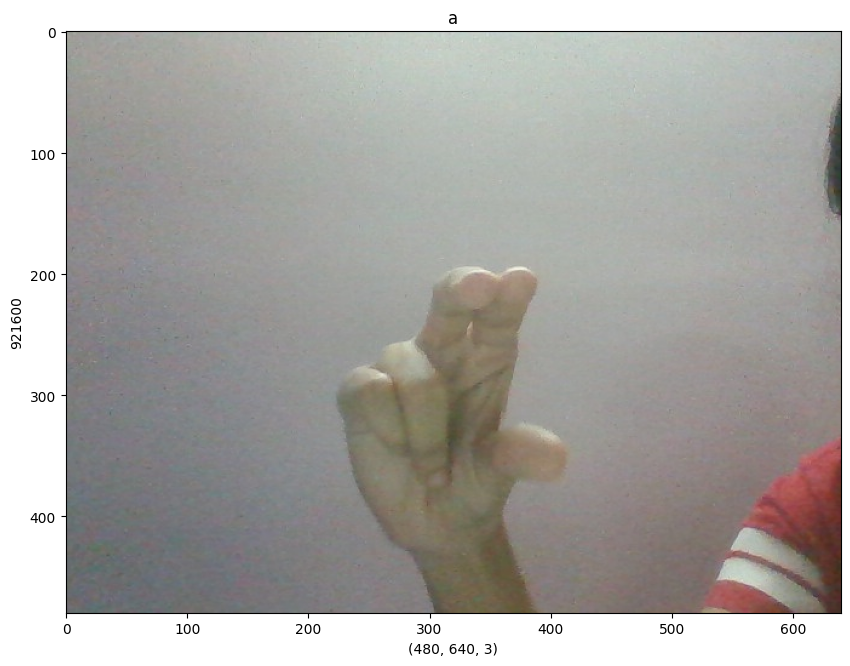

In [15]:
figure = plt.figure(figsize=(10,10))

Image_Sign = simple_vision(Main_Sign_Data["JPG"][99])

plt.xlabel(Image_Sign.shape)
plt.ylabel(Image_Sign.size)
plt.title(Main_Sign_Data["CATEGORY"][99])
plt.imshow(Image_Sign)

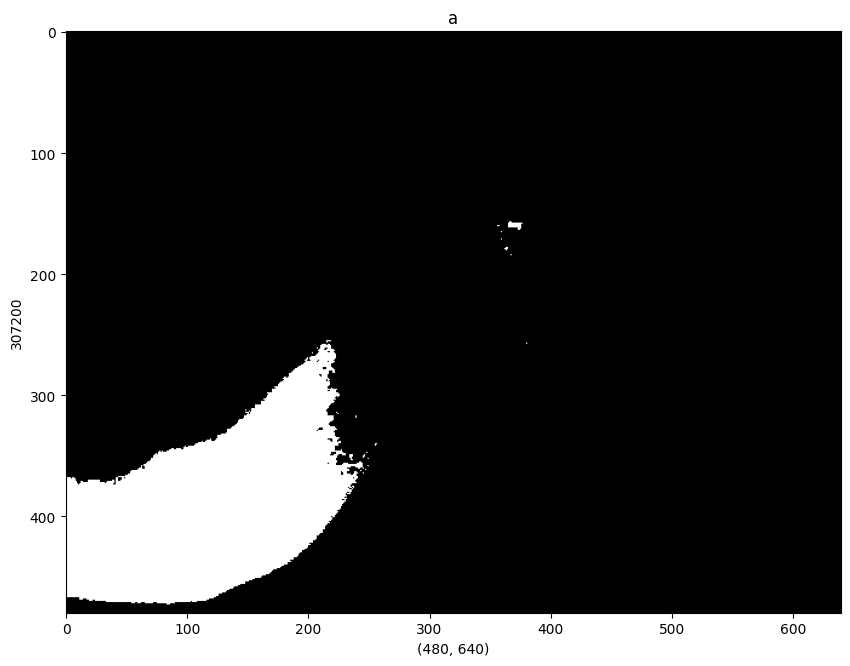

In [16]:
figure = plt.figure(figsize=(10,10))

Image_Sign = threshold_vision(Main_Sign_Data["JPG"][33])

plt.xlabel(Image_Sign.shape)
plt.ylabel(Image_Sign.size)
plt.title(Main_Sign_Data["CATEGORY"][33])
plt.imshow(Image_Sign,cmap="gray")

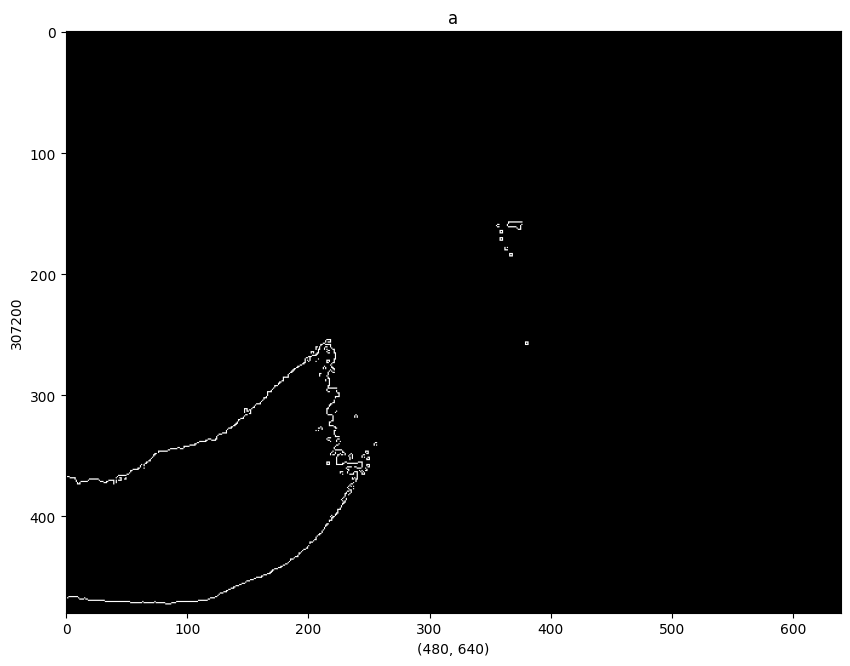

In [17]:
figure = plt.figure(figsize=(10,10))

Image_Sign = canny_vision(Main_Sign_Data["JPG"][33])

plt.xlabel(Image_Sign.shape)
plt.ylabel(Image_Sign.size)
plt.title(Main_Sign_Data["CATEGORY"][33])
plt.imshow(Image_Sign,cmap="gray")

C:\Users\mehro\AppData\Local\Temp\ipykernel_25060\2363011511.py:5: FutureWarning: use_gaussian_derivatives currently defaults to False, but will change to True in a future version. Please specify this argument explicitly to maintain the current behavior
  Hessian_Mat = hessian_matrix(Example_Image,sigma=5,order="rc")


Text(0.5, 1.0, 'a')

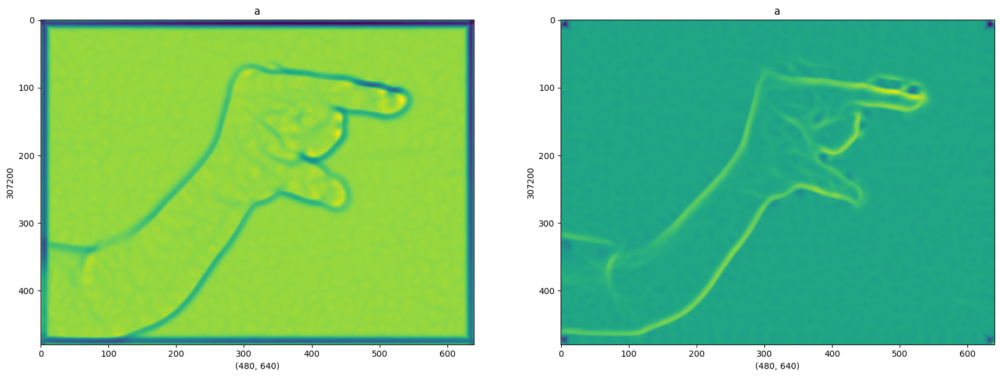

In [18]:
figure,axis = plt.subplots(nrows=1,ncols=2,figsize=(20,20))

Example_Image = cv2.cvtColor(cv2.imread(Main_Sign_Data["JPG"][33]),cv2.COLOR_BGR2GRAY)

Hessian_Mat = hessian_matrix(Example_Image,sigma=5,order="rc")
max_S,min_S = hessian_matrix_eigvals(Hessian_Mat)

axis[0].imshow(min_S)
axis[0].set_xlabel(min_S.shape)
axis[0].set_ylabel(min_S.size)
axis[0].set_title(Main_Sign_Data["CATEGORY"][33])
axis[1].imshow(max_S)
axis[1].set_xlabel(max_S.shape)
axis[1].set_ylabel(max_S.size)
axis[1].set_title(Main_Sign_Data["CATEGORY"][33])

Text(0.5, 1.0, 'a')

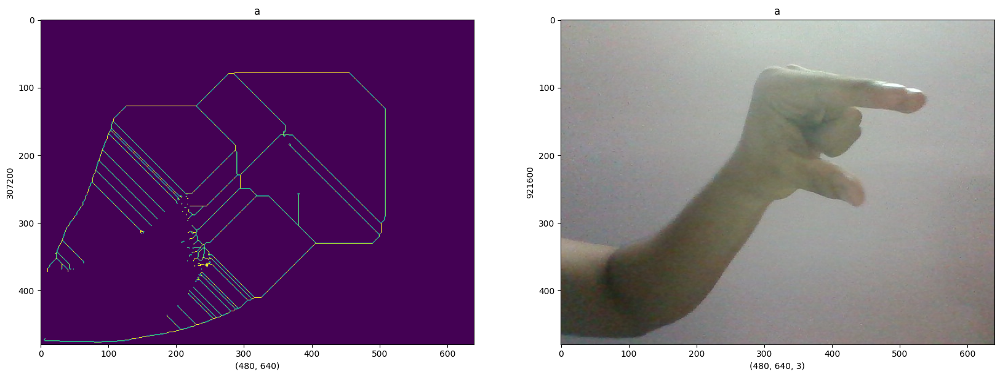

In [19]:
figure,axis = plt.subplots(nrows=1,ncols=2,figsize=(20,20))

Skel_Img = skeleton_morph_vision(Main_Sign_Data["JPG"][33])
Simple_Img = simple_vision(Main_Sign_Data["JPG"][33])

axis[0].imshow(Skel_Img)
axis[0].set_xlabel(Skel_Img.shape)
axis[0].set_ylabel(Skel_Img.size)
axis[0].set_title(Main_Sign_Data["CATEGORY"][33])
axis[1].imshow(Simple_Img)
axis[1].set_xlabel(Simple_Img.shape)
axis[1].set_ylabel(Simple_Img.size)
axis[1].set_title(Main_Sign_Data["CATEGORY"][33])

In [20]:
X_Train,X_Test = train_test_split(Main_Sign_Data,train_size=0.9,random_state=123,shuffle=True)

In [21]:
print(X_Train.shape)
print(X_Test.shape)

(3225, 2)
(359, 2)


In [22]:
print(type(X_Train))
print(type(X_Test))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


In [23]:
Train_IMG_Generator = ImageDataGenerator(rescale=1./255,
                                        zoom_range=0.5,
                                        shear_range=0.5,
                                        brightness_range=[0.6,1.0],
                                        rotation_range=35,
                                        width_shift_range=0.1,
                                        height_shift_range=0.1,
                                        vertical_flip=True,
                                         featurewise_std_normalization=False,
                                         samplewise_center=False,
                                         samplewise_std_normalization=False,
                                        fill_mode="nearest",
                                        validation_split=0.1)

In [24]:
Test_IMG_Generator = ImageDataGenerator(rescale=1./255)

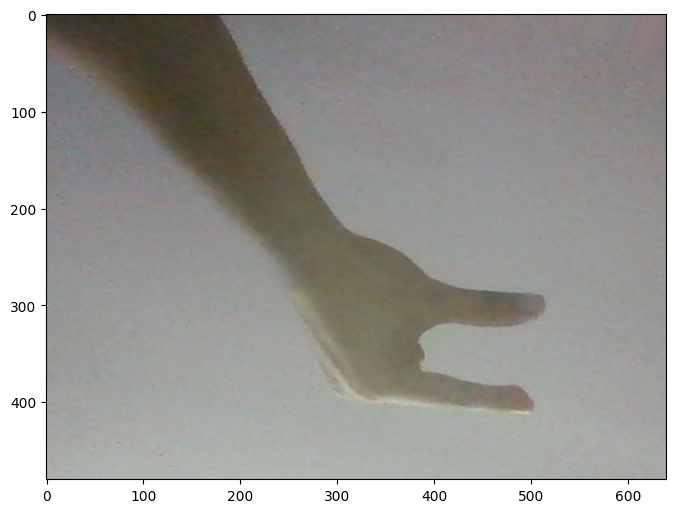

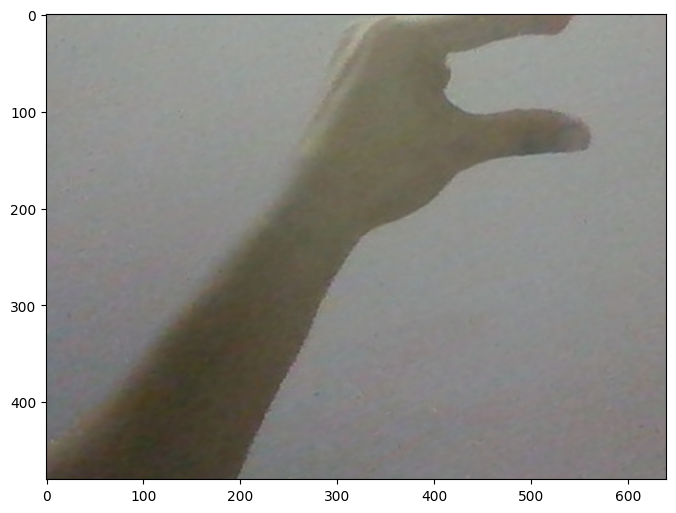

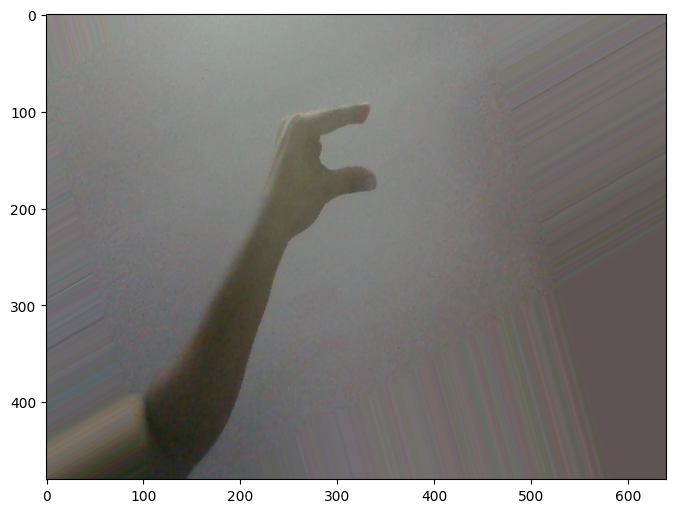

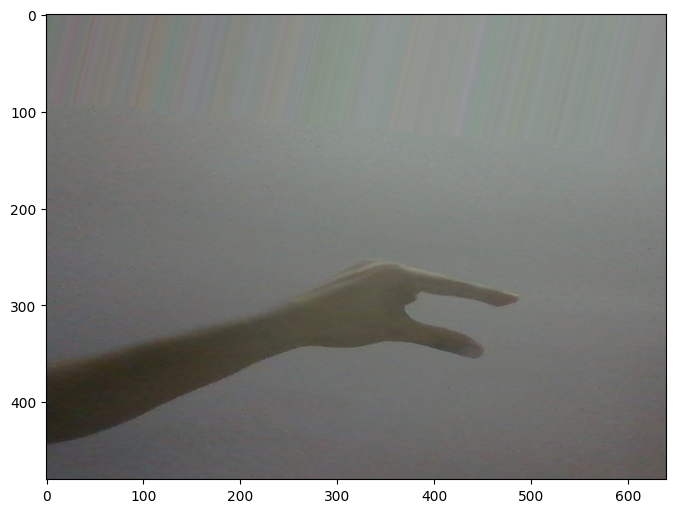

In [25]:
Example_Img = simple_vision(X_Train.JPG[3])
Example_Img = Example_Img.reshape((1,) + Example_Img.shape)

i = 0 

for batch in Train_IMG_Generator.flow(Example_Img,batch_size=32):
    
    figure = plt.figure(figsize=(8,8))
    plt.imshow(image.img_to_array(batch[0]))
    
    i += 1
    if i % 4 == 0:
        break
        
plt.show()

In [26]:
Train_Set = Train_IMG_Generator.flow_from_dataframe(dataframe=X_Train,
                                                   x_col="JPG",
                                                   y_col="CATEGORY",
                                                   batch_size=32,
                                                   class_mode="categorical",
                                                   color_mode="grayscale",
                                                   subset="training")

Found 2903 validated image filenames belonging to 36 classes.


In [27]:
Validation_Set = Train_IMG_Generator.flow_from_dataframe(dataframe=X_Train,
                                                   x_col="JPG",
                                                   y_col="CATEGORY",
                                                   batch_size=32,
                                                   class_mode="categorical",
                                                   color_mode="grayscale",
                                                   subset="validation")

Found 322 validated image filenames belonging to 36 classes.


In [28]:
Test_Set = Test_IMG_Generator.flow_from_dataframe(dataframe=X_Test,
                                                   x_col="JPG",
                                                   y_col="CATEGORY",
                                                   batch_size=32,
                                                   class_mode="categorical",
                                                   color_mode="grayscale",
                                                   shuffle=False)

Found 359 validated image filenames belonging to 36 classes.


In [29]:
print("TRAIN: ")
print(Train_Set.class_indices)
print(Train_Set.classes[0:5])
print(Train_Set.image_shape)
print("---"*20)
print("VALIDATION: ")
print(Validation_Set.class_indices)
print(Validation_Set.classes[0:5])
print(Validation_Set.image_shape)
print("---"*20)
print("TEST: ")
print(Test_Set.class_indices)
print(Test_Set.classes[0:5])
print(Test_Set.image_shape)

TRAIN: 
{'a': 0, 'aa': 1, 'ai': 2, 'au': 3, 'ba': 4, 'bha': 5, 'cha': 6, 'chha': 7, 'da': 8, 'dha': 9, 'e': 10, 'ee': 11, 'ga': 12, 'gha': 13, 'gya': 14, 'ha': 15, 'i': 16, 'ja': 17, 'jha': 18, 'ka': 19, 'kha': 20, 'ksha': 21, 'la': 22, 'ma': 23, 'na': 24, 'o': 25, 'oo': 26, 'pa': 27, 'pha': 28, 'ra': 29, 'sa': 30, 'sha': 31, 'tha': 32, 'u': 33, 'va': 34, 'ya': 35}
[18, 1, 24, 1, 4]
(256, 256, 1)
------------------------------------------------------------
VALIDATION: 
{'a': 0, 'aa': 1, 'ai': 2, 'au': 3, 'ba': 4, 'bha': 5, 'cha': 6, 'chha': 7, 'da': 8, 'dha': 9, 'e': 10, 'ee': 11, 'ga': 12, 'gha': 13, 'gya': 14, 'ha': 15, 'i': 16, 'ja': 17, 'jha': 18, 'ka': 19, 'kha': 20, 'ksha': 21, 'la': 22, 'ma': 23, 'na': 24, 'o': 25, 'oo': 26, 'pa': 27, 'pha': 28, 'ra': 29, 'sa': 30, 'sha': 31, 'tha': 32, 'u': 33, 'va': 34, 'ya': 35}
[11, 23, 22, 31, 4]
(256, 256, 1)
------------------------------------------------------------
TEST: 
{'a': 0, 'aa': 1, 'ai': 2, 'au': 3, 'ba': 4, 'bha': 5, 'cha': 6,

In [30]:
COMPILE_OPTIMIZER = "adam"
COMPILE_LOSS = "categorical_crossentropy"
COMPILE_METRICS = ["accuracy"]
INPUT_DIM = (256,256,1)
OUTPUT_DIM = 36

In [31]:
Early_Stopper = tf.keras.callbacks.EarlyStopping(monitor="loss",patience=3,mode="min")
Checkpoint_Model = tf.keras.callbacks.ModelCheckpoint(monitor="val_accuracy",
                                                      save_best_only=True,
                                                      save_weights_only=True,
                                                      filepath="./modelcheck")

In [32]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 5746576032231453027
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 2238133044
locality {
  bus_id: 1
  links {
  }
}
incarnation: 17769476250058300403
physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1650, pci bus id: 0000:01:00.0, compute capability: 7.5"
xla_global_id: 416903419
]


In [33]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras import backend as K

In [34]:
Model = Sequential()

Model.add(Conv2D(24,(3,3),activation="relu",input_shape=INPUT_DIM))
Model.add(BatchNormalization())
Model.add(MaxPooling2D((2,2),strides=2))

Model.add(Conv2D(64,(3,3),activation="relu",padding="same"))
Model.add(Dropout(0.3))
Model.add(MaxPooling2D((2,2),strides=2))

Model.add(Conv2D(64,(3,3),activation="relu",padding="same"))
Model.add(Dropout(0.3))
Model.add(MaxPooling2D((2,2),strides=2))

Model.add(Conv2D(128,(3,3),activation="relu",padding="same"))
Model.add(Conv2D(128,(3,3),activation="relu",padding="same"))
Model.add(Dropout(0.3))
Model.add(MaxPooling2D((2,2),strides=2))

Model.add(Conv2D(256,(3,3),activation="relu",padding="same"))
Model.add(Dropout(0.3))
Model.add(MaxPooling2D((2,2),strides=2))

Model.add(Flatten())
Model.add(Dense(2352,activation="relu"))
Model.add(Dropout(0.5))
Model.add(Dense(OUTPUT_DIM,activation="softmax"))

In [35]:
Model.compile(optimizer=COMPILE_OPTIMIZER,loss=COMPILE_LOSS,metrics=COMPILE_METRICS)

In [36]:
CNN_Model = Model.fit(Train_Set,
                      validation_data=Validation_Set,
                      callbacks=[Early_Stopper,Checkpoint_Model],
                      epochs=20)

Epoch 1/20
91/91 [==============================] - 82s 788ms/step - loss: 3.2484 - accuracy: 0.0613 - val_loss: 4.2911 - val_accuracy: 0.0248
Epoch 2/20
91/91 [==============================] - 43s 474ms/step - loss: 2.5704 - accuracy: 0.1585 - val_loss: 5.1655 - val_accuracy: 0.0124
Epoch 3/20
91/91 [==============================] - 44s 485ms/step - loss: 2.2261 - accuracy: 0.2460 - val_loss: 5.8384 - val_accuracy: 0.0093
Epoch 4/20
91/91 [==============================] - 46s 503ms/step - loss: 1.8728 - accuracy: 0.3817 - val_loss: 4.4944 - val_accuracy: 0.0373
Epoch 5/20
91/91 [==============================] - 45s 492ms/step - loss: 1.6062 - accuracy: 0.4550 - val_loss: 3.5354 - val_accuracy: 0.0435
Epoch 6/20
91/91 [==============================] - 54s 592ms/step - loss: 1.4389 - accuracy: 0.5184 - val_loss: 2.8585 - val_accuracy: 0.2236
Epoch 7/20
91/91 [==============================] - 46s 500ms/step - loss: 1.3081 - accuracy: 0.5546 - val_loss: 2.0594 - val_accuracy: 0.5311

In [37]:
Model.save("Prediction_Model1project1.h5")

<Axes: >

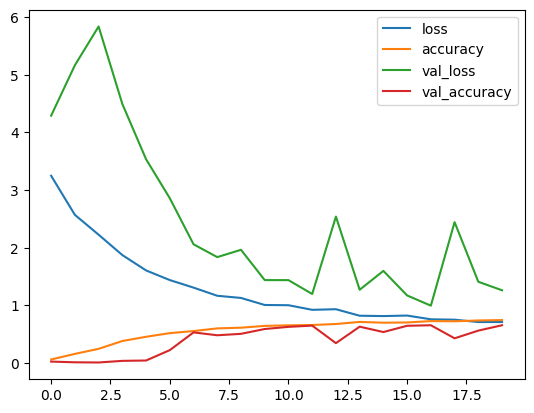

In [38]:
Grap_Data = pd.DataFrame(CNN_Model.history)
Grap_Data.plot()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


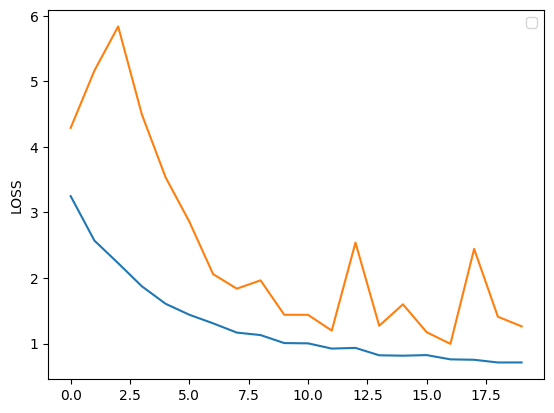

In [39]:
plt.plot(CNN_Model.history["loss"])
plt.plot(CNN_Model.history["val_loss"])
plt.ylabel("LOSS")
plt.legend()
plt.show()

In [40]:
Model_Results = Model.evaluate(Test_Set)
print("LOSS:  " + "%.4f" % Model_Results[0])
print("ACCURACY:  " + "%.2f" % Model_Results[1])

12/12 [==============================] - 5s 428ms/step - loss: 0.9968 - accuracy: 0.6741
LOSS:  0.9968
ACCURACY:  0.67


In [41]:
Model_Test_Prediction = Model.predict(Test_Set)
Model_Test_Prediction = Model_Test_Prediction.argmax(axis=-1)

12/12 [==============================] - 3s 246ms/step


In [43]:
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Set the font family to a Devanagari-compatible font
rcParams['font.family'] = 'Noto Sans Devanagari'  # Ensure the font is installed

In [46]:
from matplotlib import font_manager
import matplotlib.pyplot as plt

# Add the path to the Devanagari-compatible font
font_path = 'C:\\Users\\mehro\\Downloads\\Noto_Sans_Devanagari\\static\\NotoSansDevanagari-Bold.ttf'
font_manager.fontManager.addfont(font_path)

# Set the font properties globally
plt.rcParams['font.family'] = 'Noto Sans Devanagari'  # Replace with the actual font name

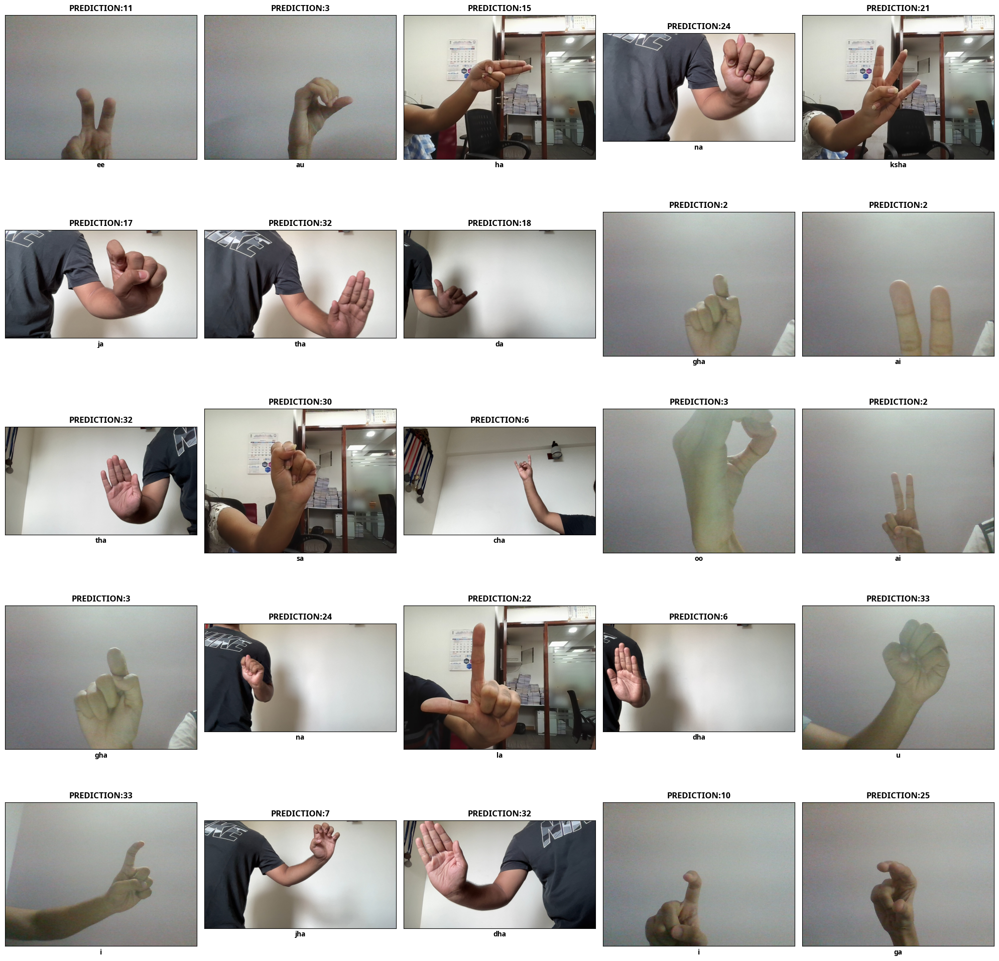

In [63]:
fig, axes = plt.subplots(nrows=5,
                         ncols=5,
                         figsize=(20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    
    ax.imshow(plt.imread(X_Test["JPG"].iloc[i]))
    ax.set_title(f"PREDICTION:{Model_Test_Prediction[i]}")
    ax.set_xlabel(X_Test["CATEGORY"].iloc[i])
plt.tight_layout()
plt.show()

In [89]:
x = (X_Test["JPG"].iloc[27])[56:58]
print(x)
type(x)

pa


str

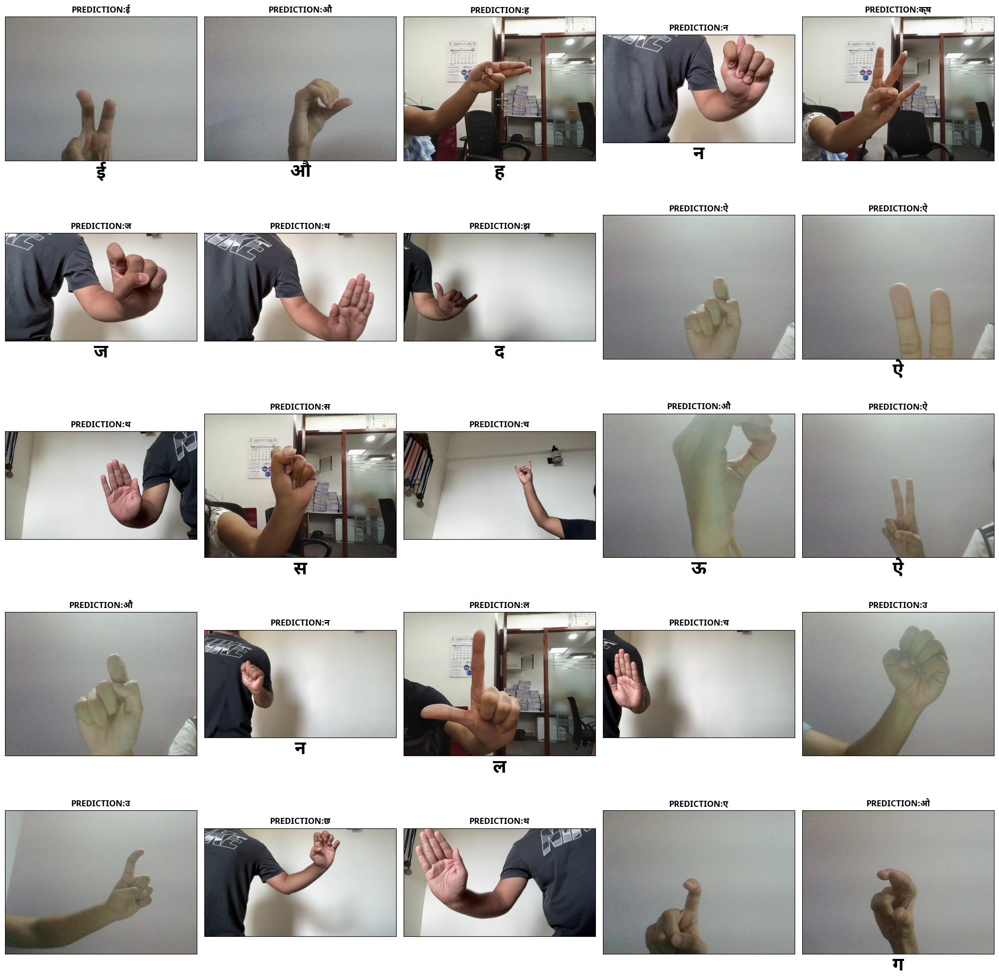

In [119]:
fig, axes = plt.subplots(nrows=5,
                         ncols=5,
                         figsize=(20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})

dict1 = {'a': 'अ', 'aa': 'आ', 'ai': 'ऐ', 'au': 'औ', 'ba': 'ब', 'bha': 'भ', 'cha': 'च', 'chha': 'छ', 'da': 'द', 'dha': 'ध ', 'e': 'ए', 'ee': 'ई', 'ga': 'ग', 'gha': 'घ', 'gya': 'ज्ञ', 'ha': 'ह', 'i': 'इ', 'ja': 'ज', 'jha': 'झ', 'ka': 'क', 'kha': 'ख ', 'ksha': 'क्ष', 'la': 'ल', 'ma': 'म ' ,'na': 'न', 'o': 'ओ', 'oo': 'ऊ', 'pa': 'प', 'pha': 'फ', 'ra': 'र', 'sa': 'स', 'sha': 'श', 'tha': 'थ', 'u': 'उ', 'va': 'व', 'ya':'य' }
dict2 = {0: 'अ', 1: 'आ', 2: 'ऐ', 3: 'औ', 4: 'ब', 5: 'भ', 6: 'च', 7: 'छ', 8: 'द', 9: 'ध ', 10: 'ए', 11: 'ई', 12: 'ग', 13: 'घ', 14: 'ज्ञ', 15: 'ह', 16: 'इ', 17: 'ज', 18: 'झ', 19: 'क', 20: 'ख ', 21: 'क्ष', 22: 'ल', 23: 'म ' ,24: 'न', 25: 'ओ', 26: 'ऊ', 27: 'प', 28: 'फ', 29: 'र', 30: 'स', 31: 'श', 32: 'थ', 33: 'उ', 34: 'व', 35:'य' }
for i, ax in enumerate(axes.flat):
    
    x=(X_Test["JPG"].iloc[i])[56:58]
    ax.imshow(plt.imread(X_Test["JPG"].iloc[i]))
    ax.set_title(f"PREDICTION:{dict2.get(Model_Test_Prediction[i])}")
    ax.set_xlabel(dict1.get(x),fontsize=26)
plt.tight_layout()
plt.show()

In [105]:
z = {"a":1,"b":2}
# Getting values out of dictionaries
print(z.get("a"))

1


In [113]:

dict1 = {'a': 'अ', 'aa': 'आ', 'ai': 'ऐ', 'au': 'औ', 'ba': 'ब', 'bha': 'भ', 'cha': 'च', 'chha': 'छ', 'da': 'द', 'dha': 'ध ', 'e': 'ए', 'ee': 'ई', 'ga': 'ग', 'gha': 'घ', 'gya': 'ज्ञ', 'ha': 'ह', 'i': 'इ', 'ja': 'ज', 'jha': 'झ', 'ka': 'क', 'kha': 'ख ', 'ksha': 'क्ष', 'la': 'ल', 'ma': 'म ' ,'na': 'न', 'o': 'ओ', 'oo': 'ऊ', 'pa': 'प', 'pha': 'फ', 'ra': 'र', 'sa': 'स', 'sha': 'श', 'tha': 'थ', 'u': 'उ', 'va': 'व', 'ya':'य' }
dict2 = {0: 'अ', 1: 'आ', 2: 'ऐ', 3: 'औ', 4: 'ब', 5: 'भ', 6: 'च', 7: 'छ', 8: 'द', 9: 'ध ', 10: 'ए', 11: 'ई', 12: 'ग', 13: 'घ', 14: 'ज्ञ', 15: 'ह', 16: 'इ', 17: 'ज', 18: 'झ', 19: 'क', 20: 'ख ', 21: 'क्ष', 22: 'ल', 23: 'म ' ,24: 'न', 25: 'ओ', 26: 'ऊ', 27: 'प', 28: 'फ', 29: 'र', 30: 'स', 31: 'श', 32: 'थ', 33: 'उ', 34: 'व', 35:'य' }
# x=(X_Test["JPG"].iloc[0])[56:58]
# print(dict1.get(x))
dict2.get(Model_Test_Prediction[4])

'क्ष'

In [120]:
x=(X_Test["JPG"].iloc[4])[56:58]


2